In [29]:
# Import necessary libraries
import json  # for handling JSON data
from collections import defaultdict  # for creating dictionaries with default values
from typing import List, Tuple  # for type hinting
import cv2 # Import OpenCV for image processing

In [30]:
def load_json(file_path):
    with open(file_path, 'r') as file:  # Open the file in read mode
        return json.load(file) # Load the JSON data from the file and return it as a dictionary

In [31]:
from google.colab.patches import cv2_imshow # For displaying images in Google Colab

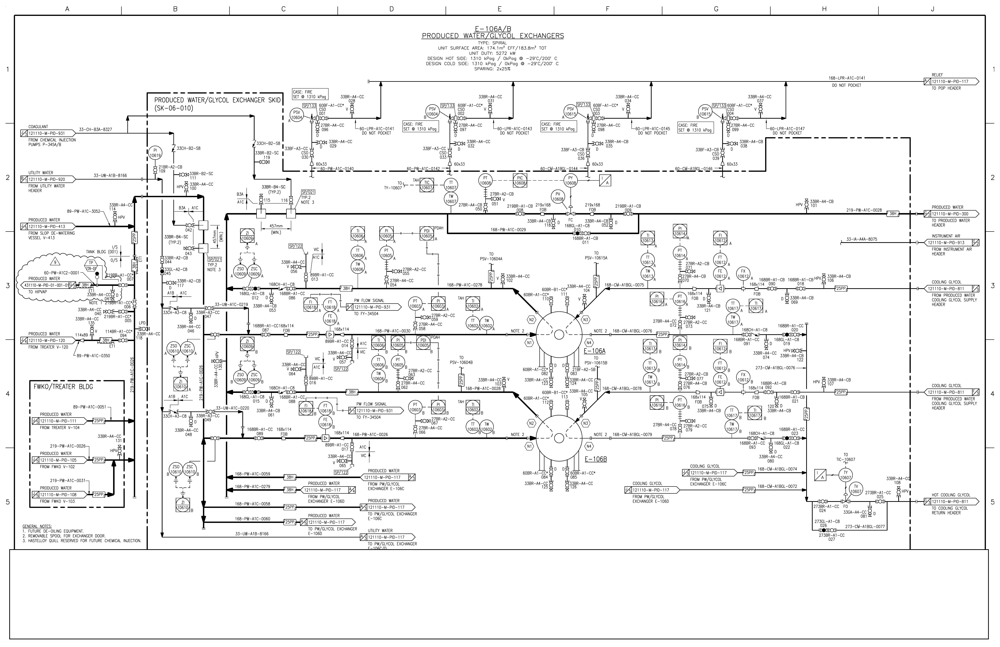

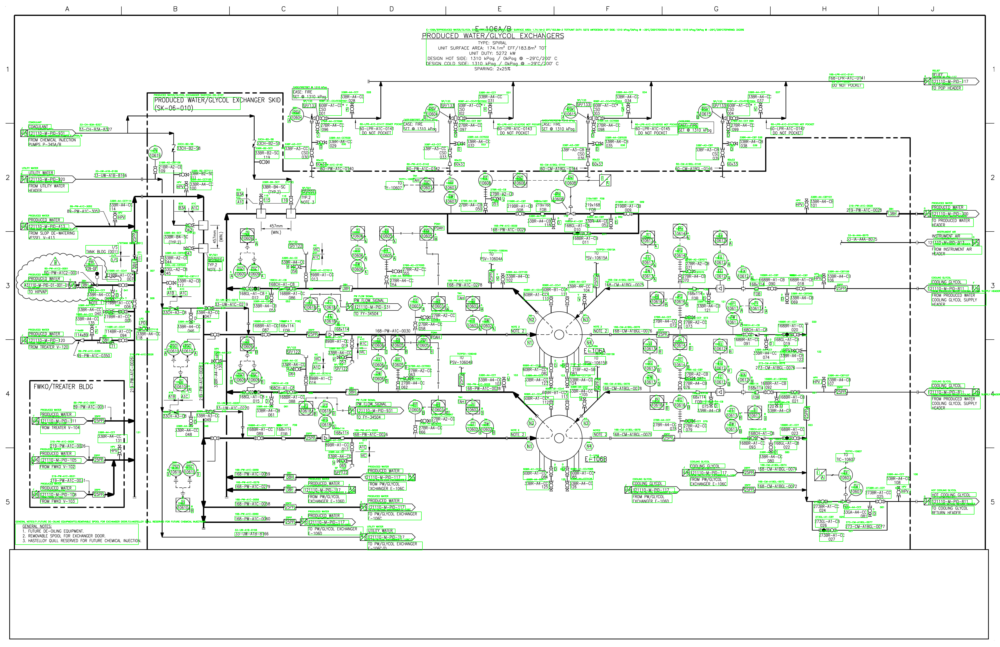

In [32]:
def draw_bounding_boxes(image_path: str, gt_json_path: str, output_image_path: str):
    """
    Draw bounding boxes on an image based on ground truth data from a JSON file and save the result.

    Args:
    - image_path (str): Path to the input image.
    - gt_json_path (str): Path to the JSON file containing ground truth bounding box data.
    - output_image_path (str): Path where the output image with bounding boxes will be saved.
    """
    # Load the ground truth JSON data using the custom load_json function
    gt_json = load_json(gt_json_path)

    # Read the image from the specified path using OpenCV
    image = cv2.imread(image_path)

    # Display the original image in the notebook (for Google Colab use cv2_imshow)
    cv2_imshow(image)
    print()  # Print a newline for better output formatting

    # Iterate through the ground truth JSON data to draw bounding boxes
    for key, val in gt_json.items():
        # Extract bounding box coordinates and text from the JSON data
        bbox = val['bbox']
        text = val['text']

        # Get the top-left and bottom-right coordinates of the bounding box
        x1, y1 = bbox[0]
        x2, y2 = bbox[2]

        # Draw a rectangle (bounding box) on the image using the coordinates
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green box with thickness of 2

        # Put the associated text above the bounding box
        cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)  # Green text

    # Save the modified image with bounding boxes to the specified output path
    cv2.imwrite(output_image_path, image)

    # Display the modified image with bounding boxes (for Google Colab use cv2_imshow)
    cv2_imshow(image)

# Define the paths to the image, ground truth JSON, and output image
image_path = r'/content/drive/MyDrive/FILE-1.jpg'
gt_json_path = r'/content/drive/MyDrive/FILE-1-ground-truth-standard-text-format.json'
output_image_path = r'/content/drive/MyDrive/FILE-1-with-bounding-boxes.jpg'  # Ensure a valid image format

# Call the function to draw bounding boxes and save the result
draw_bounding_boxes(image_path, gt_json_path, output_image_path)


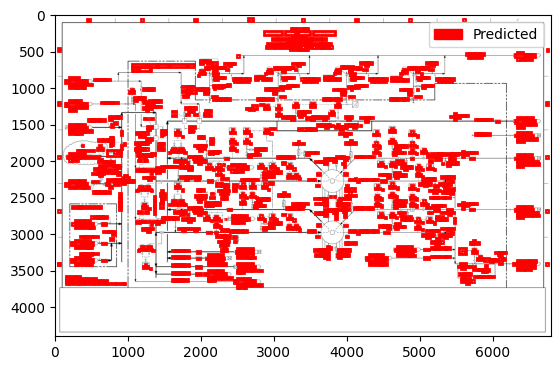

In [33]:
#visualise for predicted bounding boxes
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from typing import List, Tuple ,Dict
def plot_bounding_boxes(image_path: str, pred: Dict, gt: Dict):
    # Load the image
    image = Image.open(image_path)
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(image)

    # Plot predicted bounding boxes
    for key, value in pred.items():
        bbox = value['bbox']
        if len(bbox) == 1 and isinstance(bbox[0], list):
            bbox = bbox[0]
        x1, y1 = bbox[0]
        x2, y2= bbox[2]
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    red_patch = patches.Patch(color='red', label='Predicted')
    #green_patch = patches.Patch(color='green', label='Ground Truth')
    plt.legend(handles=[red_patch])

    plt.show()

def main(pred_file: str, gt_file: str, image_path: str):
    pred_data = load_json(pred_file)
    gt_data = load_json(gt_file)

    # Plot the bounding boxes
    plot_bounding_boxes(image_path, pred_data, gt_data)

if __name__ == "__main__":
    pred_file = '/content/drive/MyDrive/FILE-1-ocr-output.json'
    gt_file = '/content/drive/MyDrive/FILE-1-ground-truth-standard-text-format.json'
    image_path = '/content/drive/MyDrive/FILE-1.jpg'  # Provide the path to your image file
    main(pred_file, gt_file, image_path)


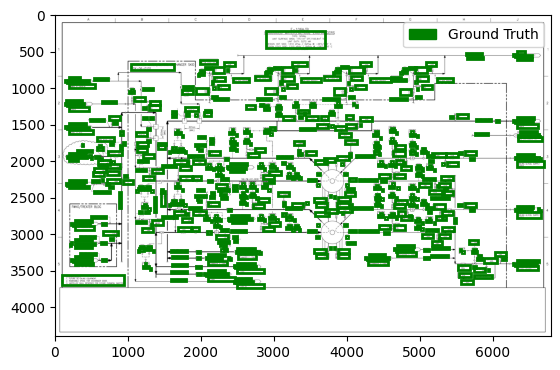

In [34]:
#visualise for ground truth bounding boxes
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
 # Plot ground truth bounding boxes
def plot_bounding_boxes(image_path: str, pred: Dict, gt: Dict):
    # Load the image
    image = Image.open(image_path)
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(image)
    for key, value in gt.items():
        bbox = value['bbox']
        if len(bbox) == 1 and isinstance(bbox[0], list):
            bbox = bbox[0]
        x1, y1 = bbox[0]  # Extract coordinates of top-left corner
        x2, y2 = bbox[2]
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='g', facecolor='none')
        ax.add_patch(rect)
    # Add a legend
   # red_patch = patches.Patch(color='red', label='Predicted')
    green_patch = patches.Patch(color='green', label='Ground Truth')
    plt.legend(handles=[green_patch])
    plt.show()

def main(pred_file: str, gt_file: str, image_path: str):
    pred_data = load_json(pred_file)
    gt_data = load_json(gt_file)
    # Plot the bounding boxes
    plot_bounding_boxes(image_path, pred_data, gt_data)

if __name__ == "__main__":
    pred_file = '/content/drive/MyDrive/FILE-1-ocr-output.json'
    gt_file = '/content/drive/MyDrive/FILE-1-ground-truth-standard-text-format.json'
    image_path = '/content/drive/MyDrive/FILE-1.jpg'  # Provide the path to your image file
    main(pred_file, gt_file, image_path)


In [35]:
"""
Loading JSON Data:
  Ground Truth Data: Contains text annotations and their corresponding bounding box coordinates.
  OCR Output Data: Contains text recognized by OCR with their bounding box coordinates.

Comparative Analysis:
  Bounding Box Comparison: Compare the bounding boxes from ground truth data with those from OCR output to assess the accuracy and overlap.
  Text Comparison: Match the recognized text with the actual text to evaluate OCR accuracy.

Observations:
  Bounding Box Accuracy: Green boxes represent ground truth annotations, and red boxes represent OCR detected text. The overlap and differences highlight the accuracy of OCR.
  Text Matching: Comparing the text inside the bounding boxes gives insights into the OCR's recognition performance, revealing any discrepancies or errors.
"""

"\nLoading JSON Data:\n  Ground Truth Data: Contains text annotations and their corresponding bounding box coordinates.\n  OCR Output Data: Contains text recognized by OCR with their bounding box coordinates.\n\nComparative Analysis:\n  Bounding Box Comparison: Compare the bounding boxes from ground truth data with those from OCR output to assess the accuracy and overlap.\n  Text Comparison: Match the recognized text with the actual text to evaluate OCR accuracy.\n\nObservations:\n  Bounding Box Accuracy: Green boxes represent ground truth annotations, and red boxes represent OCR detected text. The overlap and differences highlight the accuracy of OCR.\n  Text Matching: Comparing the text inside the bounding boxes gives insights into the OCR's recognition performance, revealing any discrepancies or errors.\n"

In [36]:
"""
Analysis and the Need for Intersection over Union (IoU):
The bounding boxes from the ground truth and the OCR output give us a way to visually compare the performance of the OCR system. However, a more quantitative measure is required to objectively assess the OCR accuracy. Intersection over Union (IoU) is a commonly used metric in object detection to evaluate the overlap between two bounding boxes.
Here's why we need to perform IoU based on our analysis:

Visual Comparison Limitation:
    While visual comparison using bounding boxes provides a qualitative assessment, it lacks precision. IoU provides a numerical value that quantifies the overlap, making it possible to objectively evaluate OCR performance.

Precision and Recall Measurement:
    IoU helps in determining how well the OCR bounding boxes match the ground truth. By setting a threshold (e.g., IoU > 0.5), we can measure precision (how many detected boxes are correct) and recall (how many ground truth boxes are detected).

Error Analysis:
    IoU allows for a detailed analysis of OCR errors. Low IoU values indicate poor localization, which helps in diagnosing specific issues such as misalignment, incorrect scaling, or text fragmentation.
"""

"\nAnalysis and the Need for Intersection over Union (IoU):\nThe bounding boxes from the ground truth and the OCR output give us a way to visually compare the performance of the OCR system. However, a more quantitative measure is required to objectively assess the OCR accuracy. Intersection over Union (IoU) is a commonly used metric in object detection to evaluate the overlap between two bounding boxes.\nHere's why we need to perform IoU based on our analysis:\n\nVisual Comparison Limitation:\n    While visual comparison using bounding boxes provides a qualitative assessment, it lacks precision. IoU provides a numerical value that quantifies the overlap, making it possible to objectively evaluate OCR performance.\n\nPrecision and Recall Measurement:\n    IoU helps in determining how well the OCR bounding boxes match the ground truth. By setting a threshold (e.g., IoU > 0.5), we can measure precision (how many detected boxes are correct) and recall (how many ground truth boxes are detec

In [37]:
def iou(bbox1, bbox2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Args:
    - bbox1: A list of two tuples representing the top-left and bottom-right coordinates of the first bounding box.
    - bbox2: A list of two tuples representing the top-left and bottom-right coordinates of the second bounding box.

    Returns:
    - A float representing the IoU between the two bounding boxes.
    """
    # Calculate the coordinates of the intersection rectangle
    x1_max = max(bbox1[0][0], bbox2[0][0])  # Maximum of the top-left x-coordinates
    y1_max = max(bbox1[0][1], bbox2[0][1])  # Maximum of the top-left y-coordinates
    x2_min = min(bbox1[2][0], bbox2[2][0])  # Minimum of the bottom-right x-coordinates
    y2_min = min(bbox1[2][1], bbox2[2][1])  # Minimum of the bottom-right y-coordinates

    # Calculate the area of the intersection rectangle
    inter_area = max(0, x2_min - x1_max) * max(0, y2_min - y1_max)

    # Calculate the area of both bounding boxes
    bbox1_area = (bbox1[2][0] - bbox1[0][0]) * (bbox1[2][1] - bbox1[0][1])
    bbox2_area = (bbox2[2][0] - bbox2[0][0]) * (bbox2[2][1] - bbox2[0][1])

    # Calculate the area of the union of both bounding boxes
    union_area = bbox1_area + bbox2_area - inter_area

    # Check for zero union area to avoid division by zero
    if union_area == 0:
        return 0.0

    # Calculate and return the Intersection over Union (IoU)
    return inter_area / union_area


In [38]:
def match_bounding_boxes(gt_boxes, pred_boxes, iou_threshold=0.5):
    """
    Match ground truth bounding boxes with predicted bounding boxes based on IoU threshold.

    Args:
    - gt_boxes: Dictionary containing ground truth bounding boxes with keys as identifiers and values as dictionaries with 'bbox' key.
    - pred_boxes: Dictionary containing predicted bounding boxes with keys as identifiers and values as dictionaries with 'bbox' key.
    - iou_threshold: Float value representing the minimum IoU required to consider a match (default is 0.7).

    Returns:
    - A list of tuples where each tuple contains a matched pair of ground truth and predicted box keys.
    """
    matches = []  # List to store matched pairs of ground truth and predicted bounding boxes
    used_preds = set()  # Set to keep track of predicted boxes that have been matched

    # Iterate over each ground truth bounding box
    for gt_key, gt_val in gt_boxes.items():
        best_iou = 0  # Initialize the best IoU found for the current ground truth box
        best_pred_key = None  # Initialize the best matching predicted box key

        # Iterate over each predicted bounding box
        for pred_key, pred_val in pred_boxes.items():
            if pred_key in used_preds:
                continue  # Skip the predicted box if it has already been matched

            # Calculate the IoU between the current ground truth and predicted bounding boxes
            current_iou = iou(gt_val['bbox'], pred_val['bbox'])

            # Check if the current IoU is better than the best IoU found so far
            if current_iou > best_iou:
                best_iou = current_iou  # Update the best IoU
                best_pred_key = pred_key  # Update the best matching predicted box key

        # Check if the best IoU found is above the threshold
        if best_iou >= iou_threshold:
            matches.append((gt_key, best_pred_key))  # Add the match to the list
            used_preds.add(best_pred_key)  # Mark the predicted box as used

    return matches  # Return the list of matched pairs


In [39]:
def calculate_metrics(gt_json, pred_json):
    # Copy ground truth and predicted bounding boxes dictionaries
    gt_boxes = {k: v for k, v in gt_json.items()}
    pred_boxes = {k: v for k, v in pred_json.items()}

    # Match predicted boxes to ground truth boxes
    matches = match_bounding_boxes(gt_boxes, pred_boxes)

    # Calculate true positives (TP), false positives (FP), and false negatives (FN)
    tp = len(matches)  # True positives: Number of matched boxes
    fp = len(pred_boxes) - tp  # False positives: Predicted boxes not matched with any ground truth
    fn = len(gt_boxes) - tp   # False negatives: Ground truth boxes not matched with any prediction

    # Calculate precision, recall, and F1 score
    precision = tp / (tp + fp) if tp + fp > 0 else 0
    recall = tp / (tp + fn) if tp + fn > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    # Calculate text accuracy among matched boxes
    text_matches = sum(1 for gt_key, pred_key in matches if gt_boxes[gt_key]['text'] == pred_boxes[pred_key]['text'])
    text_accuracy = text_matches / tp if tp > 0 else 0

    # Create a dictionary to store and return calculated metrics
    metrics = {
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'text_accuracy': text_accuracy
    }

    return metrics


In [40]:
# Load ground truth and predicted JSON files
gt_json = load_json(r'/content/drive/MyDrive/FILE-1-ground-truth-standard-text-format.json')
pred_json = load_json(r'/content/drive/MyDrive/FILE-1-ocr-output.json')

# Calculate metrics using the calculate_metrics function
metrics = calculate_metrics(gt_json, pred_json)

# Print the calculated metrics
print(metrics)

{'precision': 0.14033457249070633, 'recall': 0.4289772727272727, 'f1_score': 0.211484593837535, 'text_accuracy': 0.9735099337748344}
